# 1. Data Source and Contents

In [ ]:
# to get runtime for question 8
# do not run cell 
import timeit
start = timeit.default_timer()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
df = pd.read_csv('/content/census_data.csv') 
df.head()

Q.1.1 Why does it makes sense to discretize columns for this problem?
Continuous variables would make it harder to train the model. There would be a lot more combinations that could be made with continous variables, which would mean we would either need more data to train the model or our prediction would be much less accurate

---


Q.1.2 What might be the issues (if any) if we DID NOT discretize the columns.
If we didn't discretize the columns, we would need a lot more training data for the prediction to close to accurate. Our prediction would probably not be accurate, due to the high number of possible combinations. 

# 2. Data Analysis

In [ ]:
df.describe
df.shape
df.count
df.isnull().sum()
df.info
df.head(10)
df.tail(10)

,hours_per_week_bin,occupation_bin,msr_bin,capital_gl_bin,race_sex_bin,education_num_bin,education_bin,workclass_bin,age_bin,flag,y
48832,d. 41-50 & 61-70,c. Mid - Mid,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,c. 31-35 & 61-70,test,0
48833,b. 31-40,c. Mid - Mid,c. High,a. = 0,c. High,b. 9-12,b. Mid,b. income,c. 31-35 & 61-70,test,0
48834,b. 31-40,a. Low,a. Low,a. = 0,b. Mid,b. 9-12,b. Mid,b. income,a. 0-25,test,0
48835,b. 31-40,a. Low,b. Mid,a. = 0,c. High,d. 14,d. Masters,b. income,e. 40-55,test,0
48836,b. 31-40,e. High,a. Low,a. = 0,c. High,c. 13,c. Bachelors,b. income,c. 31-35 & 61-70,test,0
48837,b. 31-40,e. High,b. Mid,a. = 0,b. Mid,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,test,0
48838,b. 31-40,b. Mid - Low,a. Low,a. = 0,b. Mid,b. 9-12,b. Mid,a. no income,c. 31-35 & 61-70,test,0
48839,d. 41-50 & 61-70,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,d. 36-40 & 56-60,test,0
48840,b. 31-40,b. Mid - Low,a. Low,c. > 0,c. High,c. 13,c. Bachelors,b. income,e. 40-55,test,0
48841,e. 51-60,e. High,c. High,a. = 0,c. High,c. 13,c. Bachelors,b. income,c. 31-35 & 61-70,test,1


# 3. Exploratory Data Analysis

In [ ]:
# get percent of each bin that has flag = 0 vs flag = 1
#slice dataframe to get percentages
## Table :
  # columns: age_bins, percent_1, percent_0

age = pd.DataFrame(df.groupby('age_bin').agg('sum').y)

age['percent_1'] = 100*age.y/age.y.sum()
age['percent_0'] = 100 - (100*age.y/age.y.sum())

In [ ]:
age.head()

,y,percent_1,percent_0
age_bin,,,
a. 0-25,169,1.446051,98.553949
b. 26-30 & 71-100,975,8.342603,91.657397
c. 31-35 & 61-70,2255,19.294943,80.705057
d. 36-40 & 56-60,2955,25.284504,74.715496
e. 40-55,5333,45.631899,54.368101


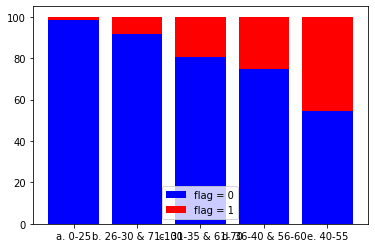

In [ ]:
plt.bar(age.index, age['percent_0'], color = 'B', label = 'flag = 0')
plt.bar(age.index, age['percent_1'],  color = 'R', label = 'flag = 1', bottom=age['percent_0'])
plt.legend()
plt.show()

In [ ]:
education = pd.DataFrame(df.groupby('education_bin').agg('sum').y)

education['percent_1'] = 100*education.y/education.y.sum()
education['percent_0'] = 100 - (100*education.y/education.y.sum())

In [ ]:
education.head()

,y,percent_1,percent_0
education_bin,,,
a. Low,366,3.131685,96.868315
b. Mid,5501,47.069393,52.930607
c. Bachelors,3313,28.347737,71.652263
d. Masters,1459,12.483957,87.516043
e. High,1048,8.967229,91.032771


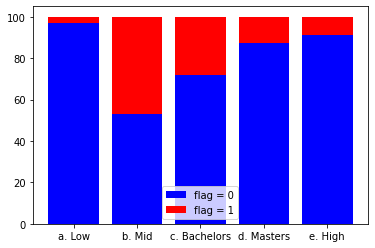

In [ ]:
# Education, 5 bins
plt.bar(education.index, education['percent_0'], color = 'B', label = 'flag = 0')
plt.bar(education.index, education['percent_1'],  color = 'R', label = 'flag = 1', bottom=education['percent_0'])
plt.legend()
plt.show()

In [ ]:
hours_per_week = pd.DataFrame(df.groupby('hours_per_week_bin').agg('sum').y)

hours_per_week['percent_1'] = 100*hours_per_week.y/hours_per_week.y.sum()
hours_per_week['percent_0'] = 100 - (100*hours_per_week.y/hours_per_week.y.sum())

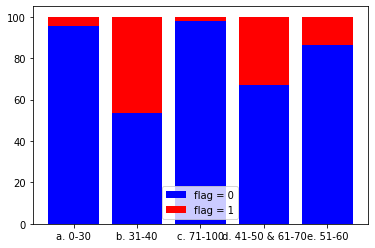

In [ ]:
# Hours per Week, 5 bins
plt.bar(hours_per_week.index, hours_per_week['percent_0'], color = 'B', label = 'flag = 0')
plt.bar(hours_per_week.index, hours_per_week['percent_1'],  color = 'R', label = 'flag = 1', bottom=hours_per_week['percent_0'])
plt.legend()
plt.show()

In [ ]:
MSR = pd.DataFrame(df.groupby('msr_bin').agg('sum').y)

MSR['percent_1'] = 100*MSR.y/MSR.y.sum()
MSR['percent_0'] = 100 - (100*MSR.y/MSR.y.sum())

MSR.head()

,y,percent_1,percent_0
msr_bin,,,
a. Low,176,1.505947,98.494053
b. Mid,1572,13.450843,86.549157
c. High,9939,85.043210,14.956790


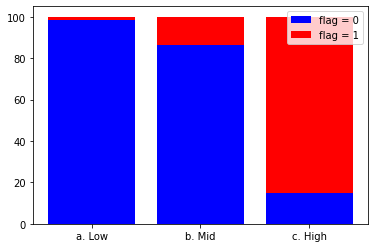

In [ ]:
# Marriage Status and Relationship, 3 bins
plt.bar(MSR.index, MSR['percent_0'], color = 'B', label = 'flag = 0')
plt.bar(MSR.index, MSR['percent_1'],  color = 'R', label = 'flag = 1', bottom=MSR['percent_0'])
plt.legend()
plt.show()

In [ ]:
occupation = pd.DataFrame(df.groupby('occupation_bin').agg('sum').y)

occupation['percent_1'] = 100*occupation.y/occupation.y.sum()
occupation['percent_0'] = 100 - (100*occupation.y/occupation.y.sum())

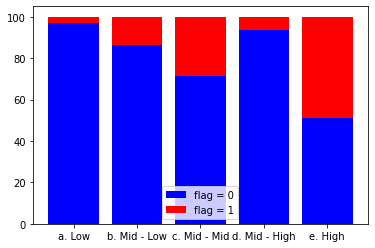

In [ ]:
# Occupation, 5 bins
plt.bar(occupation.index, occupation['percent_0'], color = 'B', label = 'flag = 0')
plt.bar(occupation.index, occupation['percent_1'],  color = 'R', label = 'flag = 1', bottom=occupation['percent_0'])
plt.legend()
plt.show()

In [ ]:
race_sex = pd.DataFrame(df.groupby('race_sex_bin').agg('sum').y)

race_sex['percent_1'] = 100*race_sex.y/race_sex.y.sum()
race_sex['percent_0'] = 100 - (100*race_sex.y/race_sex.y.sum())

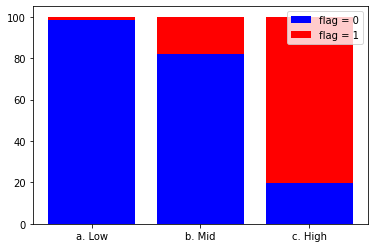

In [ ]:
# Rase and sex, 3 bins
plt.bar(race_sex.index, race_sex['percent_0'], color = 'B', label = 'flag = 0')
plt.bar(race_sex.index, race_sex['percent_1'],  color = 'R', label = 'flag = 1', bottom=race_sex['percent_0'])
plt.legend()
plt.show()

# 4. Build Decision Tree Classifier Models

In [ ]:
import os
import numpy as np
from collections import Counter
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score

In [ ]:
# not used
# creates dataframe with same shape, extracting the first char (a, b, c, d, or e)
# extract_features2 actually used so data can be converted to floats

def extract_features (data):
  new_dataframe = data.copy(deep = True)
  list = ['hours_per_week_bin', 'occupation_bin', 'msr_bin', 'capital_gl_bin',	'race_sex_bin',	'education_num_bin', 'education_bin',	'workclass_bin',	'age_bin']
  row_count = 0
  col_count = 0
  count = data.shape[0]
  for col_name in list:
    #zero to the count of rows using count function
    for row in range(count):
      split_results = data.loc[row, col_name].split('.')
      new_dataframe.iloc[row,col_count] = split_results[0]
      row_count = row_count+1
    col_count = col_count+1
  return new_dataframe

In [ ]:
# create dataframe with same shape, extracting the first char (a, b, c, d, or e)
#let a = 1, b = 2, c = 3, d = 4 and e = 5
#put these numbers in place of actual data to represent each bin

def extract_features2 (data):
  new_dataframe = data.copy(deep = True)
  list = ['hours_per_week_bin', 'occupation_bin', 'msr_bin', 'capital_gl_bin',	'race_sex_bin',	'education_num_bin', 'education_bin',	'workclass_bin',	'age_bin']
  row_count = 0
  col_count = 0
  count = data.shape[0]
  for col_name in list:
    #zero to the count of rows using count function
    for row in range(count):
      split_results = data.loc[row, col_name].split('.')
      if split_results[0] == 'a':
        new_dataframe.iloc[row,col_count] = 1
      elif split_results[0] == 'b':
        new_dataframe.iloc[row,col_count] = 2
      elif split_results[0] == 'c':
        new_dataframe.iloc[row,col_count] = 3
      elif split_results[0] == 'd':
        new_dataframe.iloc[row,col_count] = 4
      elif split_results[0] == 'e':
        new_dataframe.iloc[row,col_count] = 5
      row_count = row_count+1
    col_count = col_count+1
  return new_dataframe

In [ ]:
X_train = pd.DataFrame(df[df.flag == 'train'].loc[:, ['hours_per_week_bin', 'occupation_bin', 'msr_bin', 'capital_gl_bin',	'race_sex_bin',	'education_num_bin', 'education_bin',	'workclass_bin',	'age_bin']])
X_test_df = pd.DataFrame(df[df.flag == 'test'].loc[:, ['hours_per_week_bin', 'occupation_bin', 'msr_bin', 'capital_gl_bin',	'race_sex_bin',	'education_num_bin', 'education_bin',	'workclass_bin',	'age_bin']])
X = X_test_df.reset_index()
X_test = X.drop(columns = 'index')
y_train = df[df.flag == 'train'].loc[:, 'y']
y_test = df[df.flag == 'test'].loc[:, 'y']

In [ ]:
features_matrix = extract_features2(X_train)

In [ ]:
test_features_matrix = extract_features2(X_test)

In [ ]:
from sklearn.tree import DecisionTreeClassifier

dtree = DecisionTreeClassifier(max_depth = 10, random_state = 101, max_features = None, min_samples_leaf = 15)

dtree.fit(features_matrix, y_train)
y_pred = dtree.predict(test_features_matrix)

# 5. Visualize Your Decision Tree using GraphViz

/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.757916 to fit



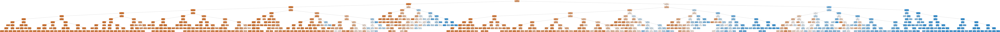

In [ ]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()
export_graphviz(dtree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

# 6. Evaluate Decisiont Tree Performance

In [ ]:
#confusion_matrix
from sklearn import metrics
metrics.confusion_matrix(y_test, y_pred)

#results:
#array([[11542,   893],
#       [ 1679,  2167]])

array([[11607,   828],
       [ 1715,  2131]])

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score

threshold = 0.5
y_pred_class = y_pred > threshold
tn, fp, fn, tp = confusion_matrix(y_test, y_pred_class).ravel()
accuracy = (tp + tn) / (tp + fp + fn + tn)
print(accuracy)

#accuracy score = 0.8438
y_pred = dtree.predict(test_features_matrix)
print (accuracy_score(y_test, y_pred))

0.8438056630428107
0.8438056630428107


In [ ]:
from sklearn import metrics

#AUC = 0.74
metrics.roc_auc_score(y_test, y_pred)

0.7437479573971861

In [ ]:
from sklearn.metrics import f1_score

# f1 score = 0.62
y_pred_class = y_pred > threshold
f1_score(y_test, y_pred_class)

0.6263041880969876

In [ ]:
from sklearn.metrics import average_precision_score

#Average precision score = 0.5
average_precision_score(y_test, y_pred)

0.5043740392015064

In [ ]:
metrics.recall_score(y_test, y_pred)

0.5540821632865315

# 7. Tune Decision Tree Performance

In [ ]:
#get model performance scores
def model_performance(test, pred): 
#accuracy score
  print('Accuracy score: ', accuracy_score(test, pred))
#recall
  print ('Recall: ', metrics.recall_score(test, pred))
#precision
  threshold = 0.5
  y_pred_class = pred > threshold
  print('Precision: ', average_precision_score(test, pred))
#f1 score
  print('f1 score: ', f1_score(test, y_pred_class))

In [ ]:
#1 split criteria: entropy
dtree = DecisionTreeClassifier(criterion = 'entropy', max_depth = 10, random_state = 101, max_features = None, min_samples_leaf = 15)

dtree.fit(features_matrix, y_train)
y_pred = dtree.predict(test_features_matrix)
model_performance(y_test, y_pred)

Accuracy score:  0.8441741907745225
Recall:  0.5611024440977639
Precision:  0.506359239731979
f1 score:  0.6297971691230119


In [ ]:
#2 split criteria: entropy
dtree = DecisionTreeClassifier(criterion = 'entropy', min_samples_split = 10, max_depth = 10, random_state = 101, max_features = None, min_samples_leaf = 15)

dtree.fit(features_matrix, y_train)
y_pred = dtree.predict(test_features_matrix)
model_performance(y_test, y_pred)

Accuracy score:  0.8441741907745225
Recall:  0.5611024440977639
Precision:  0.506359239731979
f1 score:  0.6297971691230119


In [ ]:
#3 split criteria: entropy
dtree = DecisionTreeClassifier(criterion = 'entropy', max_depth = 10, random_state = 101, max_features = None, min_samples_leaf = 25)

dtree.fit(features_matrix, y_train)
y_pred = dtree.predict(test_features_matrix)
model_performance(y_test, y_pred)

TypeError: ignored

In [ ]:
#4 split criteria: entropy
dtree = DecisionTreeClassifier(criterion = 'entropy', max_depth = 20, random_state = 101, max_features = None, min_samples_leaf = 15)

dtree.fit(features_matrix, y_train)
y_pred = dtree.predict(test_features_matrix)
model_performance(y_test, y_pred)

Accuracy score:  0.8424543946932007
Recall:  0.5670826833073322
Precision:  0.5036969331492784
f1 score:  0.6297098310957124


In [ ]:
#5 split criteria: gini
dtree = DecisionTreeClassifier(criterion = 'gini', max_depth = 10, random_state = 101, max_features = None, min_samples_leaf = 15)

dtree.fit(features_matrix, y_train)
y_pred = dtree.predict(test_features_matrix)
model_performance(y_test, y_pred)

Accuracy score:  0.8438056630428107
Recall:  0.5540821632865315
Precision:  0.5043740392015064
f1 score:  0.6263041880969876


In [ ]:
#6 split criteria: gini
dtree = DecisionTreeClassifier(criterion = 'gini', min_samples_split = 10, max_depth = 10, random_state = 101, max_features = None, min_samples_leaf = 15)

dtree.fit(features_matrix, y_train)
y_pred = dtree.predict(test_features_matrix)
model_performance(y_test, y_pred)

Accuracy score:  0.8438056630428107
Recall:  0.5540821632865315
Precision:  0.5043740392015064
f1 score:  0.6263041880969876


In [ ]:
#7 split criteria: gini
dtree = DecisionTreeClassifier(criterion = 'gini', max_depth = 10, random_state = 101, max_features = None, min_samples_leaf = 25)

dtree.fit(features_matrix, y_train)
y_pred = dtree.predict(test_features_matrix)
model_performance(y_test, y_pred)

Accuracy score:  0.8441127694859039
Recall:  0.5603224128965159
Precision:  0.5060935122426503
f1 score:  0.6293808411214953


In [ ]:
#8 split criteria: gini
dtree = DecisionTreeClassifier(criterion = 'gini', max_depth = 20, random_state = 101, max_features = None, min_samples_leaf = 15)

dtree.fit(features_matrix, y_train)
y_pred = dtree.predict(test_features_matrix)
model_performance(y_test, y_pred)

Accuracy score:  0.8420244456728703
Recall:  0.5634425377015081
Precision:  0.5021394086884559
f1 score:  0.6275702287865624


# 8. Conclusion

In [ ]:
#Q.8.1: How long was your total run time to train the model?
#8.1 check runtime - click on next cell and do run all before to get runtime
stop = timeit.default_timer()

print('Time: ', stop - start) 
#50.16065701599996 seconds

Time:  50.16065701599996


Q.8.2: Did you find the BEST TREE?

---
Yes, and it happnes to be the tree with the given hyperparameters at the start.


Accuracy score:  0.8441741907745225
Recall:  0.5611024440977639
Precision:  0.506359239731979
f1 score:  0.6297971691230119
dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.73642 to fit



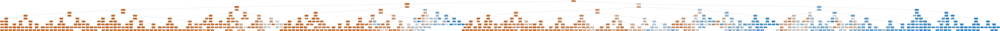

In [ ]:
#8.3: best tree
dtree = DecisionTreeClassifier(criterion = 'entropy', max_depth = 10, random_state = 101, max_features = None, min_samples_leaf = 15)

dtree.fit(features_matrix, y_train)
y_pred = dtree.predict(test_features_matrix)
model_performance(y_test, y_pred)

dot_data = StringIO()
export_graphviz(dtree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

Q.8.4: What makes it the best tree?

---
This is the best tree, as the accuracy score, recall, precisions and F1 score is the highest with these hyper parameters. There was one other tree with the same model performance scores, where the only difference was the minimum sample split. In the tree shown above, the minimum sample split is defaulted at 2, but in the other tree it is 10, which did not make a difference in terms of model performance. The scores for all the other trees did not change by much, but were still slightly lower.


# 9. Automation of Performance Tuning

In [ ]:
#upload hpyerparameters.csv to drive and read it in a pandas dataframe
hp = pd.read_csv('/content/hyperparameters.csv') 
hp.drop(index = [8,9], inplace=True)
hp.info()
#convert floats to int
hp = hp.astype({"Minimum Sample Split":'int', "Minimum Sample Leaf":'int', "Maximum Depth":'int'})  
hp.info()
hp

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8 entries, 0 to 7
Data columns (total 4 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Split Criteria (Entropy or Gini)  8 non-null      object 
 1   Minimum Sample Split              8 non-null      float64
 2   Minimum Sample Leaf               8 non-null      float64
 3   Maximum Depth                     8 non-null      float64
dtypes: float64(3), object(1)
memory usage: 320.0+ bytes
<class 'pandas.core.frame.DataFrame'>
Int64Index: 8 entries, 0 to 7
Data columns (total 4 columns):
 #   Column                            Non-Null Count  Dtype 
---  ------                            --------------  ----- 
 0   Split Criteria (Entropy or Gini)  8 non-null      object
 1   Minimum Sample Split              8 non-null      int64 
 2   Minimum Sample Leaf               8 non-null      int64 
 3   Maximum Depth                     8 non-null      

,Split Criteria (Entropy or Gini),Minimum Sample Split,Minimum Sample Leaf,Maximum Depth
0,entropy,2,15,10
1,entropy,10,15,10
2,entropy,2,25,10
3,entropy,2,15,20
4,gini,2,15,10
5,gini,10,15,10
6,gini,2,25,10
7,gini,2,15,20


In [ ]:
def performance_tuning(params, test, pred): 
  MP = pd.DataFrame(columns = ['Accuracy', 'Recall', 'Precision', 'F1 Score'])
  count = params.shape[0]
  for row in range(count):
    dtree = DecisionTreeClassifier(criterion = params.iloc[row,0], min_samples_split = params.iloc[row,1], min_samples_leaf = params.iloc[row,2], max_depth = params.iloc[row,3], random_state = 101, max_features = None, )

    dtree.fit(features_matrix, y_train)
    y_pred = dtree.predict(test_features_matrix)
    #model_performance(y_test, y_pred)
#accuracy score
    acc_score = accuracy_score(test, pred)
#recall
    recall = metrics.recall_score(test, pred)
#precision
    threshold = 0.5
    y_pred_class = pred > threshold
    precision = average_precision_score(test, pred)
#f1 score
    f1 = f1_score(test, y_pred_class)
    MP.append({'Accuracy':acc_score, 'Recall':recall, 'Precision':precision, 'F1 Score':f1}, ignore_index=True)
  return MP

In [ ]:
def performance_tuning2(params, test, pred): 
  list0 = []
  list1 = []
  list2 = []
  list3 = []
  count = params.shape[0]
  for row in range(count):
    dtree = DecisionTreeClassifier(criterion = params.iloc[row,0], min_samples_split = params.iloc[row,1], min_samples_leaf = params.iloc[row,2], max_depth = params.iloc[row,3], random_state = 101, max_features = None, )
    dtree.fit(features_matrix, y_train)
    y_pred = dtree.predict(test_features_matrix)
#accuracy score
    acc_score = accuracy_score(test, pred)
#recall
    recall = metrics.recall_score(test, pred)
#precision
    threshold = 0.5
    y_pred_class = pred > threshold
    precision = average_precision_score(test, pred)
#f1 score
    f1 = f1_score(test, y_pred_class)
    list0.append(acc_score)
    list1.append(recall)
    list2.append(precision)
    list3.append(f1)

  MP = pd.DataFrame([list0, list1, list2, list3]).T
  MP.columns =['Accuracy', 'Recall', 'Precision', 'F1 Score']
  return MP

In [ ]:
mp = performance_tuning2(hp, y_test, y_pred)
mp.head()

,Accuracy,Recall,Precision,F1 Score
0,0.843499,0.559802,0.504669,0.628246
1,0.843499,0.559802,0.504669,0.628246
2,0.843499,0.559802,0.504669,0.628246
3,0.843499,0.559802,0.504669,0.628246
4,0.843499,0.559802,0.504669,0.628246


# 10. Prediciton using your "trained" Decision Tree Model

In [ ]:
list = ['hours_per_week_bin', 'occupation_bin', 'msr_bin', 'capital_gl_bin',	'race_sex_bin',	'education_num_bin', 'education_bin',	'workclass_bin',	'age_bin']
pred_df = pd.DataFrame([['d', 'b', 'c', 'c', 'b', 'b', 'b', 'b', 'd']], columns=list)
test2 = extract_features2(pred_df)


#dtree = DecisionTreeClassifier(max_depth = 10, random_state = 101, max_features = None, min_samples_leaf = 15)

#dtree.fit(features_matrix, y_train)
y_pred2 = dtree.predict(test2)
print(y_pred2)
#y = 1

[1]
